In [1]:
from torchvision import transforms, models 
import torch
from PIL import Image
from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt
from torch.autograd import Variable
from torch.nn import functional as F
from torch import topk #return max element in dim (can return K-max elements)
import numpy as np
import skimage.transform
from torchvision.models import resnet50, ResNet50_Weights
import math
from torch import nn

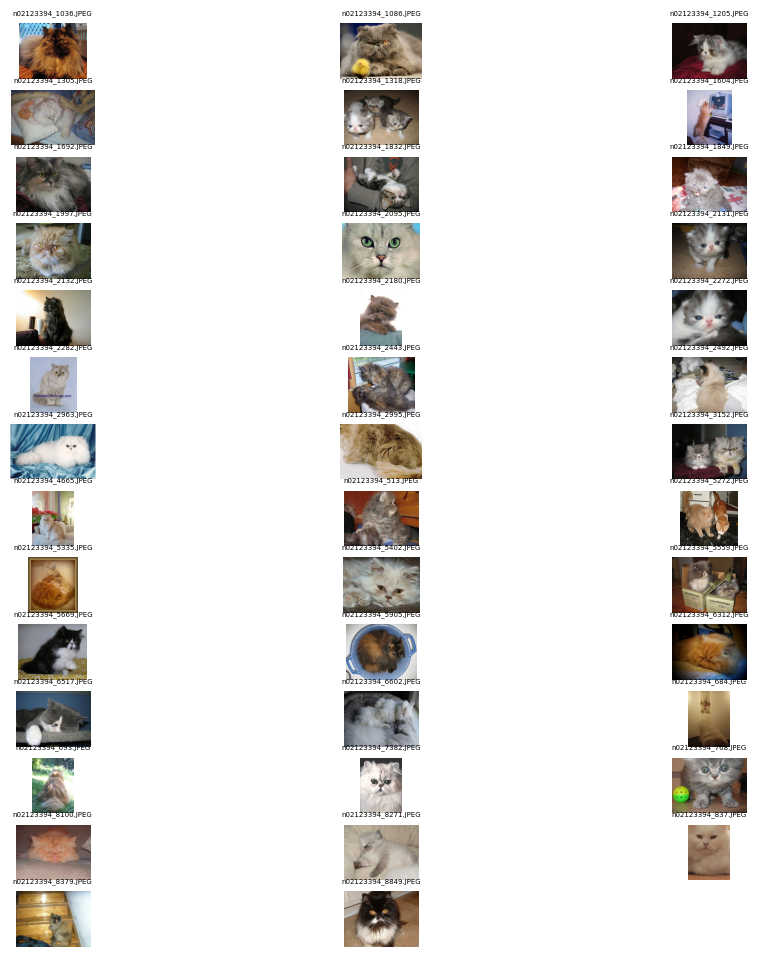

In [2]:
import os
import math

os.chdir("...") #return to root 
if os.path.isdir("catset"):
    os.chdir('catset')
    
list_of_pics = os.listdir() #list of pic's name
list_image = []
# Several pics mapping
def pics_mapping(listdir, row=2, col=3):
    row = math.ceil(len(listdir)/3)
    fig = plt.figure(figsize=(12, 12))
    for pcs in range(len(listdir)):
        fig.add_subplot(row, col, pcs+1)
        list_image.append(Image.open(str(listdir[pcs])))
        plt.imshow(Image.open(str(listdir[pcs])))
        plt.title(label=listdir[pcs], fontsize=5)
        plt.axis('off')
pics_mapping(list_of_pics)        

In [3]:
os.getcwd()

'C:\\Users\\Alex\\interpretable\\catset'

In [4]:
def preprocess_image(image):
    preprocess_callable = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]),
    transforms.Compose([transforms.Resize((224,224))])])
    
    return Variable((preprocess_callable(image).unsqueeze(0)), requires_grad=False) # 1 3 224 224

                        
preprocessing_list = [preprocess_image(image) for image in list_image]
print('Length of set: ', len(preprocessing_list), '\n', 'Size of sample: ', preprocessing_list[0].shape)

Length of set:  41 
 Size of sample:  torch.Size([1, 3, 224, 224])


C:\Users\Alex\anaconda3\Lib\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


In [5]:
os.chdir("..") #return to root 

if os.path.isdir("interpreter"):
    os.chdir("interpreter") 
print(os.getcwd())
model = models.resnet50()
model.load_state_dict(torch.load('./resnet50-0676ba61.pth'))
model.eval()
os.getcwd()

C:\Users\Alex\interpretable


'C:\\Users\\Alex\\interpretable'

In [6]:
prediction_list = [model(pred) for pred in preprocessing_list]

idx = topk(prediction_list[0], 1)[1].int() #index with top prob
idx_list = [topk(pred, 1)[1].int() for pred in prediction_list] #top index for all pcs
print('idx:', idx, '\nidx_list:', len(idx_list))

list_for_set = [torch.squeeze(lt).tolist() for lt in idx_list]
idx_numpy_type = [torch.squeeze(lt).numpy() for lt in idx_list]
print('Number of class type:', set(list_for_set))

#dict with top index classification
respectation = [{i:j} for i, j in zip(list_of_pics, idx_numpy_type)]
respectation

idx: tensor([[283]], dtype=torch.int32) 
idx_list: 41
Number of class type: {283, 700, 260, 782}


[{'n02123394_1036.JPEG': array(283)},
 {'n02123394_1086.JPEG': array(283)},
 {'n02123394_1205.JPEG': array(283)},
 {'n02123394_1305.JPEG': array(283)},
 {'n02123394_1318.JPEG': array(283)},
 {'n02123394_1604.JPEG': array(782)},
 {'n02123394_1692.JPEG': array(283)},
 {'n02123394_1832.JPEG': array(283)},
 {'n02123394_1849.JPEG': array(283)},
 {'n02123394_1997.JPEG': array(283)},
 {'n02123394_2095.JPEG': array(283)},
 {'n02123394_2131.JPEG': array(283)},
 {'n02123394_2132.JPEG': array(283)},
 {'n02123394_2180.JPEG': array(283)},
 {'n02123394_2272.JPEG': array(283)},
 {'n02123394_2282.JPEG': array(283)},
 {'n02123394_2443.JPEG': array(283)},
 {'n02123394_2492.JPEG': array(700)},
 {'n02123394_2963.JPEG': array(283)},
 {'n02123394_2995.JPEG': array(283)},
 {'n02123394_3152.JPEG': array(283)},
 {'n02123394_4665.JPEG': array(283)},
 {'n02123394_513.JPEG': array(283)},
 {'n02123394_5272.JPEG': array(283)},
 {'n02123394_5335.JPEG': array(283)},
 {'n02123394_5402.JPEG': array(283)},
 {'n02123394_

In [7]:
#crutch -> squeeze all dimension, except first
class Flatten(nn.Module):
    def __init__(self):
        super(Flatten, self).__init__()
    def forward(self, x):
        return x.view(x.size(0), -1)

In [8]:
#prediction_list -> list after model 1 x 1000
#model -> ResNet 2048 x 7 x 7 

def gradCAM_for_last_layer(predlist: list, preprocessing_list: list, model: torch.nn.Module) -> np.ndarray:
    # All layers before FNN
    layers_before_cl = nn.Sequential(*list(model.children())[:-2]) 
    #Adapt average and FNN layers without all other layers
    last_layers = nn.Sequential(*(list(model.children())[-2:-1]\
                                     + [Flatten()]\
                                         + list(model.children())[-1:]))
    #top index for all pcs
    idx_list = [topk(pred, 1)[1].int() for pred in predlist] 
    idx_numpy_type = [torch.squeeze(lt).numpy() for lt in idx_list]
    
    #activision map for all layers before 2 last
    l_2048x7x7 = [layers_before_cl(prep) for prep in preprocessing_list]
    _, N, H, W = l_2048x7x7[0].size() # 1 2048 7 7 map of saliency
    
    #insert in 2 last layers activision map 1 2048 7 7 
    l_1x1000 = [last_layers(l_2048x7x7[i])[0,idx_numpy_type[i]]  
                                     for i in range(len(l_2048x7x7))]
    
    #Computes and returns the sum of gradients of outputs with respect to the inputs. 
    grads = [torch.autograd.grad(l_1x1000[i], l_2048x7x7[i]) for i in range(len(l_1x1000))]
    gradcam = [np.maximum(torch.matmul(grads[i][0][0].mean(-1).mean(-1),\
                                      l_2048x7x7[i].view(N, H*W))\
                         .view(H, W).cpu().detach().numpy(),0) for i in range(len(l_1x1000))]
    
    return np.array(gradcam)
gradCam = gradCAM_for_last_layer(prediction_list, preprocessing_list, model)

In [9]:
# im = Image.fromarray(gradCam[0]).resize([224, 224], resample=Image.BILINEAR)
# plt.imshow(np.array(im), alpha=0.7, cmap='jet')



In [10]:
# gradCam = Image.fromarray(gradCam)
# gradCam = gradcam.resize(image.size, resample=Image.BILINEAR)


def image_grads_on_pcs(listdir: list, gradcam: list, row: int = 2, col: int = 2) -> None:
    row = math.ceil(len(listdir)/col)
    fig = plt.figure(figsize=(128, 128))
    display = transforms.Compose([transforms.Resize((224,224))])

    for pcs in range(len(listdir)):
        fig.add_subplot(row, col, pcs+1)
        plt.imshow(display(Image.open(str(listdir[pcs]))))
        plt.imshow(skimage.transform.resize(gradcam[pcs], 
                                 [224,224]), 
                                 alpha=0.7, 
                                 cmap='jet')
       
        plt.title(label=listdir[pcs], fontsize=5)
        plt.axis('off')

In [11]:
list_of_pics

['n02123394_1036.JPEG',
 'n02123394_1086.JPEG',
 'n02123394_1205.JPEG',
 'n02123394_1305.JPEG',
 'n02123394_1318.JPEG',
 'n02123394_1604.JPEG',
 'n02123394_1692.JPEG',
 'n02123394_1832.JPEG',
 'n02123394_1849.JPEG',
 'n02123394_1997.JPEG',
 'n02123394_2095.JPEG',
 'n02123394_2131.JPEG',
 'n02123394_2132.JPEG',
 'n02123394_2180.JPEG',
 'n02123394_2272.JPEG',
 'n02123394_2282.JPEG',
 'n02123394_2443.JPEG',
 'n02123394_2492.JPEG',
 'n02123394_2963.JPEG',
 'n02123394_2995.JPEG',
 'n02123394_3152.JPEG',
 'n02123394_4665.JPEG',
 'n02123394_513.JPEG',
 'n02123394_5272.JPEG',
 'n02123394_5335.JPEG',
 'n02123394_5402.JPEG',
 'n02123394_5559.JPEG',
 'n02123394_5669.JPEG',
 'n02123394_5905.JPEG',
 'n02123394_6312.JPEG',
 'n02123394_6517.JPEG',
 'n02123394_6602.JPEG',
 'n02123394_684.JPEG',
 'n02123394_693.JPEG',
 'n02123394_7382.JPEG',
 'n02123394_768.JPEG',
 'n02123394_8100.JPEG',
 'n02123394_8271.JPEG',
 'n02123394_837.JPEG',
 'n02123394_8379.JPEG',
 'n02123394_8849.JPEG']

In [12]:
print(os.getcwd()) #return to root 

if os.path.isdir("catset"):
    os.chdir("catset") 
image_grads_on_pcs(list_of_pics, gradCam)


C:\Users\Alex\interpretable
